In [4]:
pip install pynrrd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 55.0 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.12.2 requires cupy-cuda115, which is not installed.
cudf 21.12.2 requires cupy-cuda115, which is not installed.
tfx-bsl 1.12.0 requires google-api-python-client<2,>=1.7.11, but you have google-api-python-client 2.83.0 which is incompatible.
tfx-bsl 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-serving-api 2.11.0 requir

In [5]:
pip install opencv-contrib-python

ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/opt/conda/lib/python3.7/site-packages/numpy-1.21.6.dist-info/METADATA'

Note: you may need to restart the kernel to use updated packages.


In [6]:
import numpy as np
import pandas as pd
import cv2
import os 
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras.models import  Model
from tensorflow.keras.layers import Conv2D ,MaxPooling2D ,UpSampling2D ,concatenate,Dropout ,Activation ,Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler ,ReduceLROnPlateau, EarlyStopping
from tensorflow.keras import backend as K
from matplotlib import cm
import matplotlib.animation as anim
from tqdm import tqdm
from random import randint
import nibabel as nib
import pydicom as pdm
import nilearn as nl
import nilearn.plotting as nlplt
import nrrd
import h5py
from IPython.display import Image as show_gif

/opt/conda/lib/python3.7/site-packages/nilearn/__init__.py:69: FutureWarning: Python 3.7 support is deprecated and will be removed in release 0.12 of Nilearn. Consider switching to Python 3.9 or 3.10.
  _python_deprecation_warnings()


In [7]:
data = pd.read_csv('/kaggle/input/chest-ct-segmentation/train.csv')
data.head(5)

,ImageId,MaskId
0,ID00007637202177411956430_0.jpg,ID00007637202177411956430_mask_0.jpg
1,ID00007637202177411956430_1.jpg,ID00007637202177411956430_mask_1.jpg
2,ID00007637202177411956430_2.jpg,ID00007637202177411956430_mask_2.jpg
3,ID00007637202177411956430_3.jpg,ID00007637202177411956430_mask_3.jpg
4,ID00007637202177411956430_4.jpg,ID00007637202177411956430_mask_4.jpg


In [8]:
class ImageToGIF:
    """Create GIF without saving image files."""
    def __init__(self,
                 size=(600, 400), 
                 xy_text=(80, 10),
                 dpi=100, 
                 cmap='CMRmap'):

        self.fig = plt.figure()
        self.fig.set_size_inches(size[0] / dpi, size[1] / dpi)
        self.xy_text = xy_text
        self.cmap = cmap
        
        self.ax = self.fig.add_axes([0, 0, 1, 1])
        self.ax.set_xticks([])
        self.ax.set_yticks([])
        self.images = []
 
    def add(self, *args, label, with_mask=True):
        
        image = args[0]
        mask = args[-1]
        plt.set_cmap(self.cmap)
        plt_img = self.ax.imshow(image, animated=True)
        if with_mask:
            plt_mask = self.ax.imshow(np.ma.masked_where(mask == False, mask),
                                      alpha=0.4, animated=True)

        plt_text = self.ax.text(*self.xy_text, label, color='red')
        to_plot = [plt_img, plt_mask, plt_text] if with_mask else [plt_img, plt_text]
        self.images.append(to_plot)
        plt.close()
 
    def save(self, filename, fps):
        animation = anim.ArtistAnimation(self.fig, self.images)
        animation.save(filename, writer='imagemagick', fps=fps)

In [9]:
def read_nrrd_file(path: str, tensor_shape: tuple ) -> np.ndarray:
    if os.path.exists(path):
        tensor = nrrd.read(path)[0] 
        tensor = np.flip(tensor, -1)  
    else: 
        tensor = np.zeros(tensor_shape, dtype=np.float32)
    return tensor

def nrrd_to_numpy(id_: str, tensor_shape: tuple):
    '''
    Returns:  all id masks in single numpy tensor.
    '''
    lung_file_path = '../input/ct-lung-heart-trachea-segmentation/nrrd_lung/nrrd_lung/' + id_ + '_lung.nrrd'
    heart_file_path  = '../input/ct-lung-heart-trachea-segmentation/nrrd_heart/nrrd_heart/' + id_ + '_heart.nrrd'      
    trachea_file_path = '../input/ct-lung-heart-trachea-segmentation/nrrd_trachea/nrrd_trachea/' + id_ + '_trachea.nrrd'

    lung_tensor = read_nrrd_file(lung_file_path, tensor_shape)
    heart_tensor = read_nrrd_file(heart_file_path, tensor_shape)
    trachea_tensor = read_nrrd_file(trachea_file_path, tensor_shape)
    
    # chek if all tensors  have the same shape.
    if not (lung_tensor.shape == heart_tensor.shape == trachea_tensor.shape):
        #print(lung_tensor.shape, heart_tensor.shape, trachea_tensor.shape)
        print("problem with id:", id_)
        return 
        # now each tensor channel is a mask with a unique label
    full_mask = np.stack([lung_tensor, heart_tensor, trachea_tensor])
    print("shape : ", full_mask.shape)
    # reorient the axes from CHWB to BWHC
    full_mask = np.moveaxis(full_mask,
                            [0, 1, 2, 3],
                            [3, 2, 1, 0]).astype(np.float32)

    return full_mask

In [10]:
sample_path =  '../input/osic-pulmonary-fibrosis-progression/train/ID00019637202178323708467'
sample_path_files = sorted(os.listdir(sample_path), key=lambda x: int(x[:-4]))

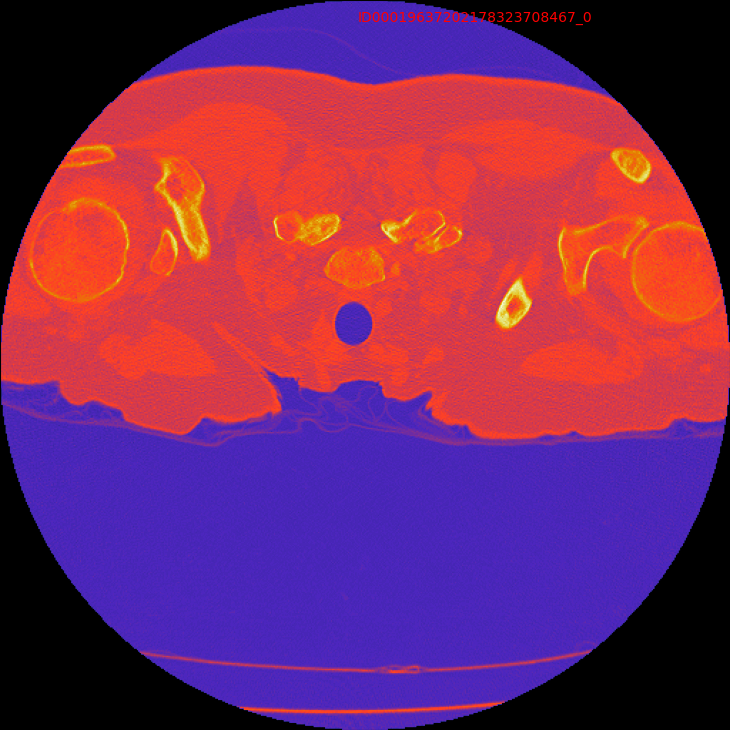

In [11]:
sample_data_gif = ImageToGIF(size=(730,730 ),
                             xy_text=(250, 15))

label = sample_path.split('/')[-1]
for i in range(len(sample_path_files)):
    path = os.path.join(sample_path, sample_path_files[i])
    image = pdm.dcmread(path).pixel_array
    sample_data_gif.add(image, label=f'{label}_{str(i)}', with_mask=False)

sample_data_gif.save(f'{label}.gif', fps=8)
show_gif(f'{label}.gif', format='png')

In [12]:
id_ = 'ID00019637202178323708467'
sample_masks = nrrd_to_numpy(id_, (768, 768))
sample_masks.shape

shape :  (3, 512, 512, 29)


(29, 512, 512, 3)

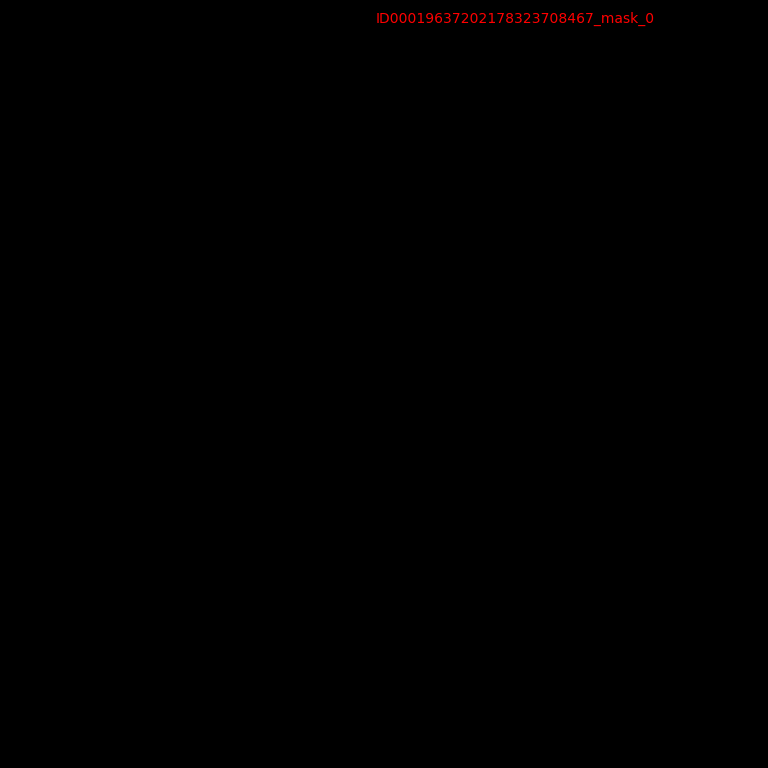

In [13]:
sample_data_gif = ImageToGIF(size=(768, 768),
                             xy_text=(250, 15))

label = id_ + '_mask'
for i in range(sample_masks.shape[0]):
    sample_data_gif.add(sample_masks[i],label=f'{label}_{str(i)}', with_mask=False)
 
sample_data_gif.save(f'{label}.gif', fps=8)
show_gif(f'{label}.gif', format='png')

In [14]:
class ImageToGIF:
    def __init__(self,
                 size=(768, 768), 
                 xy_text=(250, 25),
                 dpi=100):
        
        self.fig = plt.figure()
        self.fig.set_size_inches(size[0] / dpi, size[1] / dpi)
        self.xy_text = xy_text
        
        self.ax = self.fig.add_axes([0, 0, 1, 1])
        self.ax.set_xticks([])
        self.ax.set_yticks([])
        self.images = []
 
    def add(self, image, mask, label, with_mask=True):
        
        lung, heart, trachea = [mask[:, :, i] for i in range(3)]
        plt_img = self.ax.imshow(image, cmap="bone", animated=True)

        # Overlaying segmentation masks
        plt_mask1 = self.ax.imshow(np.ma.masked_where(lung == False, lung),
                               cmap='cool', alpha=0.3, animated=True)
        plt_mask2 = self.ax.imshow(np.ma.masked_where(heart == False, heart),
                               cmap='autumn', alpha=0.3, animated=True)
        plt_mask3 = self.ax.imshow(np.ma.masked_where(trachea == False, trachea),
                               cmap='autumn_r', alpha=0.3, animated=True) #cool_r - blue
        plt_text = self.ax.text(*self.xy_text, label, color='red')
        to_plot = [plt_img, plt_mask1, plt_mask2, plt_mask3, plt_text] 
        self.images.append(to_plot)
        plt.close()
 
    def save(self, filename, fps):
        animation = anim.ArtistAnimation(self.fig, self.images)
        animation.save(filename, writer='imagemagick', fps=fps)

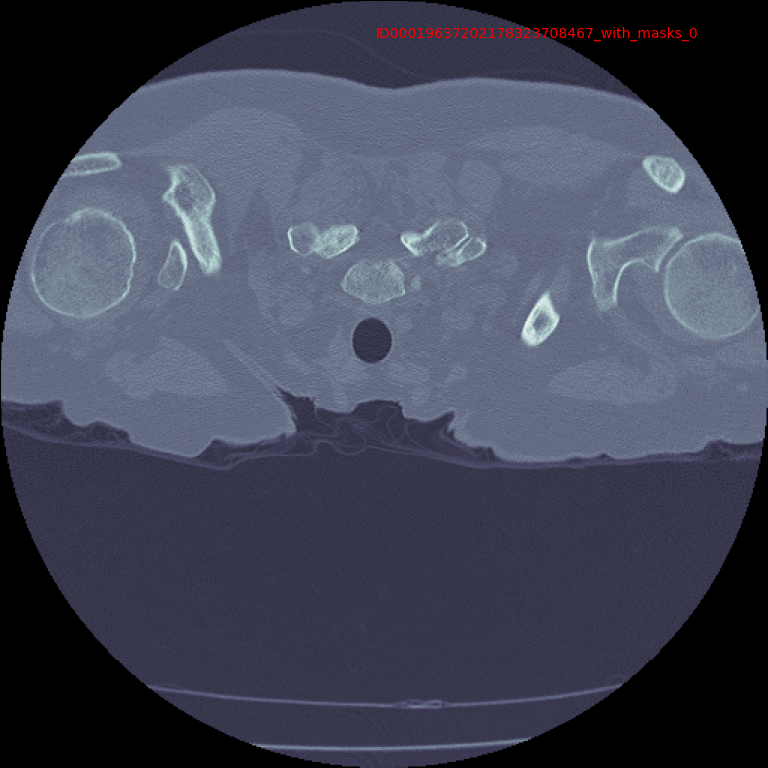

In [15]:
sample_data_gif = ImageToGIF()

label = id_ + '_with_masks'
for i in range(sample_masks.shape[0]):
    path = os.path.join(sample_path, sample_path_files[i])
    image = pdm.dcmread(path).pixel_array
    mask = sample_masks[i]
    sample_data_gif.add(image, mask, label=f'{label}_{str(i)}',)
    
sample_data_gif.save(f'{label}.gif', fps=8)
show_gif(f'{label}.gif', format='png')

In [16]:
img  = plt.imread('../input/chest-ct-segmentation/images/images/ID00007637202177411956430_20.jpg')
mask = plt.imread('../input/chest-ct-segmentation/masks/masks/ID00007637202177411956430_mask_20.jpg')

print("Image Shape : " , img.shape)
print("Mask Shape : " , mask.shape)

Image Shape :  (512, 512)
Mask Shape :  (512, 512, 3)


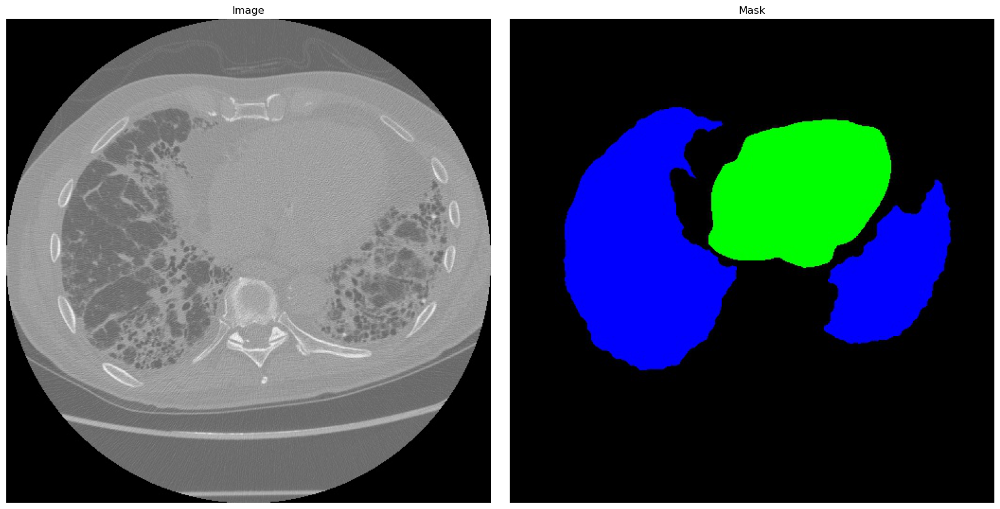

In [17]:
# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 8), constrained_layout=True)

# Plot the first image on the left subplot
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
axs[0].axis('off')
axs[0].set_title('Image')
# Plot the second image on the right subplot
axs[1].imshow(mask)
axs[1].axis('off')
axs[1].set_title('Mask')

# Show the figure
plt.show()

In [18]:
from keras.preprocessing.image import ImageDataGenerator
# we create two instances with the same arguments

# VI Note: use the same seed for image_datagen and mask_datagen to ensure the transformation for image and mask is the same
data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest',
                    rescale=1./255,
                    validation_split = 0.2)

mask_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest',
                    rescale=1./255,
                    validation_split = 0.2)
                    

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen  = ImageDataGenerator(**mask_gen_args)

In [19]:
IMG_SIZE = (224,224) # resolution
BATCH_SIZE = 16
directory='../input/chest-ct-segmentation/'

image_generator = image_datagen.flow_from_dataframe(
    dataframe=data,
    directory=directory + '/images/images',
    class_mode=None,
    #classes=['images'],
    x_col='ImageId',
    seed=50,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    target_size=IMG_SIZE,
    subset='training'
)

image_generator_val = image_datagen.flow_from_dataframe(
    dataframe=data,
    directory=directory + '/images/images',
    class_mode=None,
    #classes=['images'],
    x_col='ImageId',
    seed=50,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    target_size=IMG_SIZE,
    subset='validation'
)

Found 13367 validated image filenames.
Found 3341 validated image filenames.


In [20]:
mask_generator = mask_datagen.flow_from_dataframe(
    dataframe=data,
    directory= directory + '/masks/masks',
    #classes=['masks'],
    class_mode=None,
    x_col='MaskId',
    seed=50,
    batch_size=BATCH_SIZE,
    color_mode='rgb',
    target_size=IMG_SIZE,
    subset='training')

mask_generator_val = mask_datagen.flow_from_dataframe(
    dataframe=data,
    directory=directory + '/masks/masks',
    #classes=['masks'],
    class_mode=None,
    x_col='MaskId',
    seed=50,
    batch_size=BATCH_SIZE,
    color_mode='rgb',
    target_size=IMG_SIZE,
    subset='validation')

Found 13367 validated image filenames.
Found 3341 validated image filenames.


In [21]:
train_generator = zip(image_generator, mask_generator)
def train_generator_fn():
    for (img,mask) in train_generator:
        yield (img,mask) 
valid_generator = zip(image_generator_val, mask_generator_val)
def valid_generator_fn():
    for (img,mask) in valid_generator:
        yield (img,mask)  

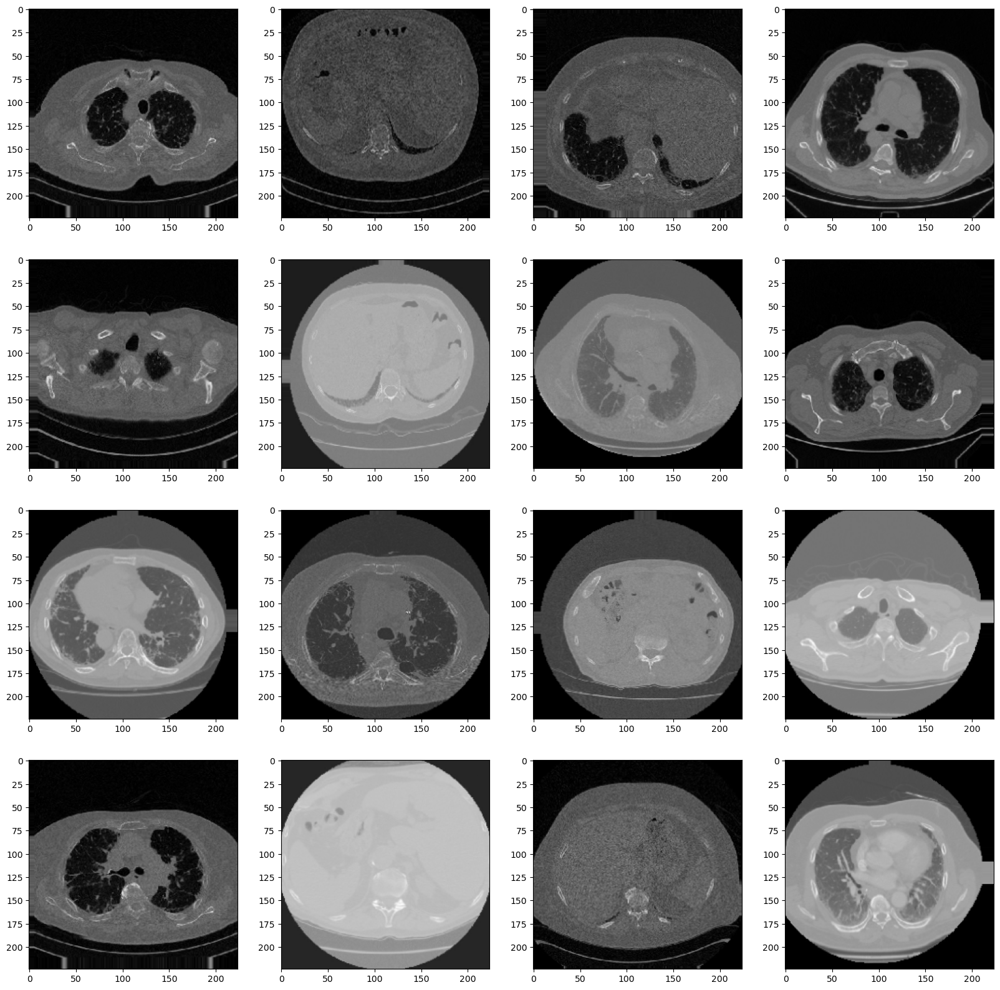

In [22]:
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i],cmap='gray')
    # show the plot
    plt.show()
    break

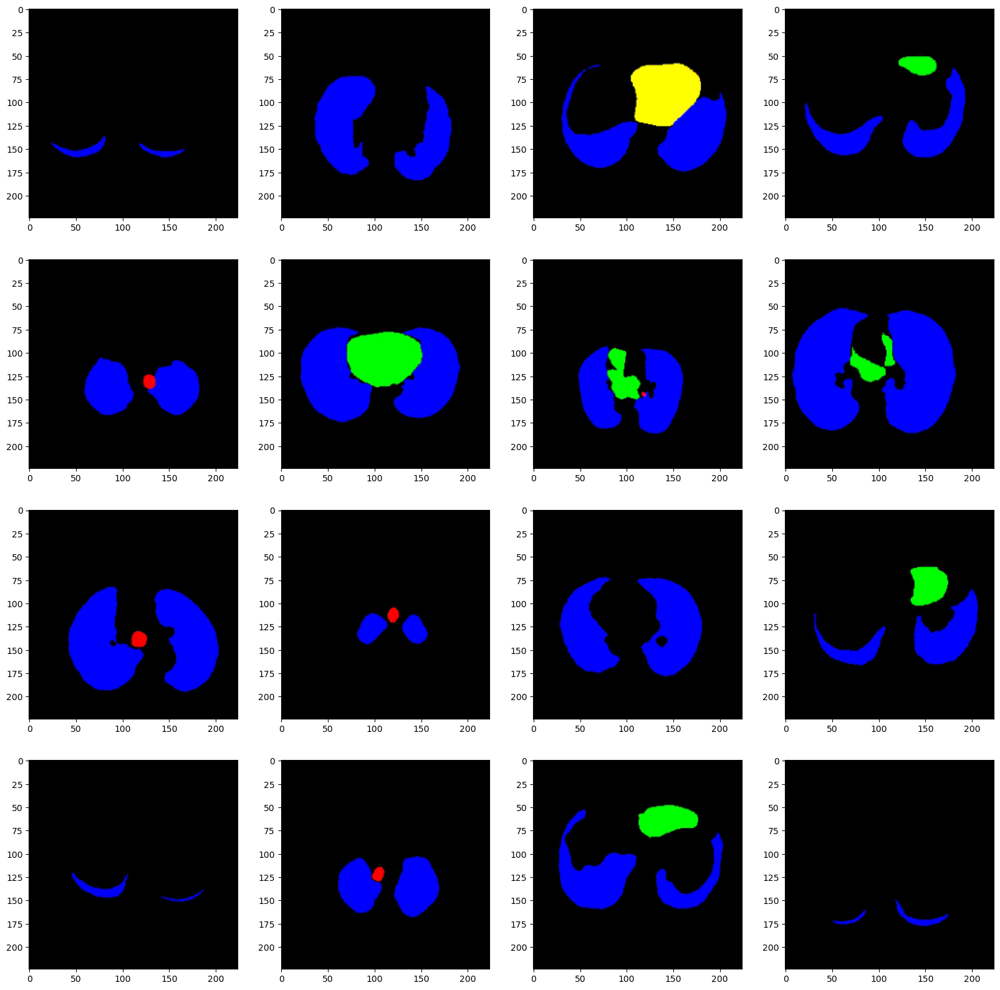

In [23]:
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(y_batch[i])
    # show the plot
    plt.show()
    break

In [24]:
smooth=1.

def dice_coef(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred)
    return (2.0 * intersection + smooth) / (union + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    return dice_coef_loss(y_true, y_pred) + bce(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

In [31]:
from tensorflow.keras import layers


def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model


# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

In [33]:
input_shape = (224,224)
# Build model
model = get_model(input_shape, 3)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 112, 112, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 112, 112, 32  128        ['conv2d_1[0][0]']               
 rmalization)                   )                                                             

In [34]:
EarlyStop=EarlyStopping(patience=10,restore_best_weights=True)
Reduce_LR=ReduceLROnPlateau(monitor='val_loss',verbose=2,factor=0.5,min_lr=0.00001)
model_checkpoint = ModelCheckpoint('unet_camvid.hdf5', monitor='val_loss',verbose=1, save_best_only=True)
callback=[EarlyStop , Reduce_LR,model_checkpoint]

In [35]:
model.compile(optimizer=Adam(learning_rate = 1e-3), loss=bce_dice_loss, metrics=["accuracy",iou, dice_coef])

In [ ]:
model.fit(train_generator_fn(),
                    validation_data=valid_generator_fn(),
                    steps_per_epoch= 100,
                    validation_steps=10,
                    epochs=10,)

In [ ]:
plt.figure(figsize=(8,15))
plt.subplot(3,1,1)
plt.plot(model.history.history['loss'], 'b-', label='train_loss')
plt.plot(model.history.history['val_loss'], 'r-', label='val_loss')
plt.legend(loc='best')
plt.title('Loss')

plt.subplot(3,1,2)
plt.plot(model.history.history['iou'], 'b-', label='train_iou')
plt.plot(model.history.history['val_iou'], 'r-', label='val_iou')
plt.legend(loc='best')
plt.title('IoU')

plt.subplot(3,1,3)
plt.plot(model.history.history['dice_coef'], 'b-', label='train_dice_coef')
plt.plot(model.history.history['val_dice_coef'], 'r-', label='val_dice_coef')
plt.legend(loc='best')
plt.title('Dice Coef')

In [ ]:
model.history.history

In [ ]:
import seaborn as sns

colors = ['#C042FF', '#03C576FF', '#FF355A', '#03C5BF', '#96C503', '#C5035B']
palettes = [sns.color_palette(colors, 2),
            sns.color_palette(colors, 4), 
            sns.color_palette(colors[:2]+colors[-2:] + colors[2:-2], 6)]
            
fig, ax = plt.subplots(1, 3, figsize=(22, 4))

sns.lineplot(data=model.history.history['val_loss'], palette=palettes[0], markers=True, ax=ax[0], linewidth=2.5,)
ax[0].set_title("Loss Function during Model Training", fontsize=14)
ax[0].set_xlabel("Epoch", fontsize=14)

sns.lineplot(data= model.history.history['val_iou'], palette=palettes[1], markers=True, ax=ax[1], linewidth=2.5, legend="full")
ax[1].set_title("Iou during Model Training", fontsize=14)
ax[1].set_xlabel("Epoch", fontsize=14)

sns.boxplot(data=model.history.history['dice_coef'], palette=palettes[2], ax=ax[2])
ax[2].set_title("Dice Coefficient for each Label from Validation", fontsize=14)